In [1]:
library(broom)
library(tidyverse)
library(dplyr)


── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.1     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.1
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors


<h3><b>1. Data Decription<b></h3>


| Column name   | Description   | Data Type     |
| ------------- | ------------- | ------------- |
| `realSum` | The total price of the Airbnb listing. | Numeric |
| `room_type` | The type of room being offered (e.g. private, shared, etc.). | Categorical |
| `room_shared` | Whether the room is shared or not. | Boolean |
| `room_private` | Whether the room is private or not. | Boolean |
| `person_capacity` | The maximum number of people that can stay in the room. | Numeric |
| `host_is_superhost` | Whether the host is a superhost or not. | Boolean |
| `multi` | Whether the listing is for multiple rooms or not. | Boolean |
| `biz` | Whether the listing is for business purposes or not. | Boolean |
| `cleanliness_rating` | The cleanliness rating of the listing. | Numeric |
| `guest_satisfaction_overall` | The overall guest satisfaction rating of the listing. | Numeric |
| `bedrooms` | The number of bedrooms in the listing. | Numeric |
| `dist` | The distance from the city centre. | Numeric |
| `metro_dist` | The distance from the nearest metro station. | Numeric |
| `lng` | The longitude of the listing. | Numeric |
| `lat` | The latitude of the listing. | Numeric |



<b>We also found the variables `attr_index`, `attr_index_norm`, `rest_index`, `rest_index_norm`, which were not described, and thus excluded.</b>



This dataset contains detailed Airbnb listing information from several major European <b>(London, Rome, Budapest)</b> cities, capturing over <b>23042 </b>observations. It includes attributes such as <i>room type, host status, guest satisfaction, number of bedrooms, and geographic data (distance from city center, latitude, and longitude)</i>, enabling spatial econometric analysis of weekday and weekend pricing. The data appears to be aggregated from Airbnb listings and reviews, reflecting both social and geographical influences on rental pricing strategies.

<h5>Dataset Summary</h5><br>
<ul>
  <li><b>Number of observations</b>: 23042</li>
  <li><b>Number of rows</b>: 15</li>
</ul>

<h3><b>2. Question <b></h3>

<b>“How does the price of Airbnb listings vary with distance from the city center, and does this relationship differ between business and non-business listings?”</b><br><br>
<i>dist</i>:Is there a trend in price based on proximity to the city center?<br>
<i>biz:</i> Do business listings have a different price than non business listings?<br>
<i>Does the effect of distance on price change depending on whether the listing is used for business?</i><br><br>
The question is an <b>inferential </b>question because:
<li>we want to draw conclusions about population</li>
<li>This question investigates whether business-targeted listings (biz) tend to be more expensive as we are closer/ farther from city centre
</li><br><br>
<b>This question could be of use for several reasons:</b><br>
1. So that airbnb hosts can deveop a pricing strategy depending on the type of listing <br>
2.It tells us how the distance plays a factor in how airbnbs are priced

<h5>Response Variable : <b>realSum</b> (price of listing)<br><br>
    Input variables : <b>biz</b>(whether listing is of type business or not) and <b>dist</b>(distance from city centre)
</h5>

<h3><b>3. Exploratory Data Analysis and Visualisation <b></h3>


We start by reading the data, and simce there are six different datasets of interest <i>(differentiated by city (London, Rome, Budapest) and that of weekend vs weekday)</i>
>We shall combine these three into a single dataset after we read them in separately

In [2]:
budapest_weekdays <-read.csv("budapest_weekdays.csv", header=TRUE)
budapest_weekends<-read.csv("budapest_weekends.csv", header=TRUE)
london_weekends<-read.csv("london_weekends.csv", header=TRUE)
london_weekdays<-read.csv("london_weekdays.csv", header = TRUE) 
rome_weekdays<-read.csv("rome_weekdays.csv", header = TRUE) 
rome_weekends<-read.csv("rome_weekends.csv", header = TRUE) 

In [6]:
# Function to format data: select vars from dataset and add city name + if it's weekend data
tidy_data <- function(data, cityName, isWeekend) {
    data <- data %>%
            select(realSum, dist, biz) # add in any other predictors
    data$city <- cityName
    data$isWeekend <- isWeekend
    return(data)
}

# Import and format data with tidy_data()
london_weekdays <- (tidy_data(read_csv("london_weekdays.csv"), "London", 0))
london_weekends <- (tidy_data(read_csv("london_weekends.csv"), "London", 1))
rome_weekdays <- (tidy_data(read_csv("rome_weekdays.csv"), "Rome", 0))
rome_weekends <- (tidy_data(read_csv("rome_weekends.csv"), "Rome", 1))
budapest_weekdays <- (tidy_data(read_csv("budapest_weekdays.csv"), "Budapest", 0))
budapest_weekends <- (tidy_data(read_csv("budapest_weekends.csv"), "Budapest", 1))

# Merge all the data together
data <- rbind(london_weekdays, london_weekends, rome_weekdays, rome_weekends, budapest_weekdays, budapest_weekends)

# Viewing the top and bottom 5 rows
head(data)
tail(data)

New names:
• `` -> `...1`
Rows: 4614 Columns: 20
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (1): room_type
dbl (16): ...1, realSum, person_capacity, multi, biz, cleanliness_rating, gu...
lgl  (3): room_shared, room_private, host_is_superhost

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
New names:
• `` -> `...1`
Rows: 5379 Columns: 20
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr  (1): room_type
dbl (16): ...1, realSum, person_capacity, multi, biz, cleanliness_rating, gu...
lgl  (3): room_shared, room_private, host_is_superhost

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.
New names:
• `` -> `...1`
Rows: 4492 Columns: 20
── Column specification ─────────────────

realSum,dist,biz,city,isWeekend
<dbl>,<dbl>,<dbl>,<chr>,<dbl>
570.0981,5.301018,0,London,0
297.9844,2.198946,0,London,0
336.7906,2.322958,0,London,0
226.7222,5.707825,0,London,0
256.3560,3.257945,0,London,0
239.8928,5.085730,0,London,0


realSum,dist,biz,city,isWeekend
<dbl>,<dbl>,<dbl>,<chr>,<dbl>
160.9719,2.199432,0,Budapest,1
100.8131,1.531943,0,Budapest,1
148.5172,1.669953,1,Budapest,1
162.8519,11.855169,0,Budapest,1
129.2475,1.669951,1,Budapest,1
129.2475,1.669965,1,Budapest,1


<b>check for NA's in our dataset</b>

In [31]:
anyNA(data) #there are no missing values in our dataset

[1] FALSE

<b>check the number of observations in our dataset </b>

In [32]:
nrow(data)

[1] 23042

We have to clean the data by removing extreme values <b>(outliers)</b> from specific numeric columns <b>(e.g., realSum, dist)</b> using the <i>Interquartile Range (IQR)</i> method
>Outliers can distort visualizations and statistical models, so cleaning them is a common EDA preprocessing step.
<br>

<li>Improves visualization clarity (e.g., histograms, scatter plots).</li>

<li>Prevents distortion of statistical summaries and models.</li>

<li>Ensures more robust analysis by focusing on the "typical" data.</li>


In [9]:
remove_outliers <- function(data, column) {
  Q1 <- quantile(pull(data, {{ column }}), 0.25, na.rm = TRUE)
  Q3 <- quantile(pull(data, {{ column }}), 0.75, na.rm = TRUE)
  IQR <- Q3 - Q1

  lower <- Q1 - 1.5 * IQR
  upper <- Q3 + 1.5 * IQR

  data %>%
    filter({{ column }} >= lower & {{ column }} <= upper)
}

data_clean <- data %>%
  remove_outliers(realSum) %>%
  remove_outliers(dist)

head(data_clean)

realSum,dist,biz,city,isWeekend
<dbl>,<dbl>,<dbl>,<chr>,<dbl>
297.9844,2.198946,0,London,0
336.7906,2.322958,0,London,0
226.7222,5.707825,0,London,0
256.3560,3.257945,0,London,0
239.8928,5.085730,0,London,0
324.0904,4.595055,0,London,0


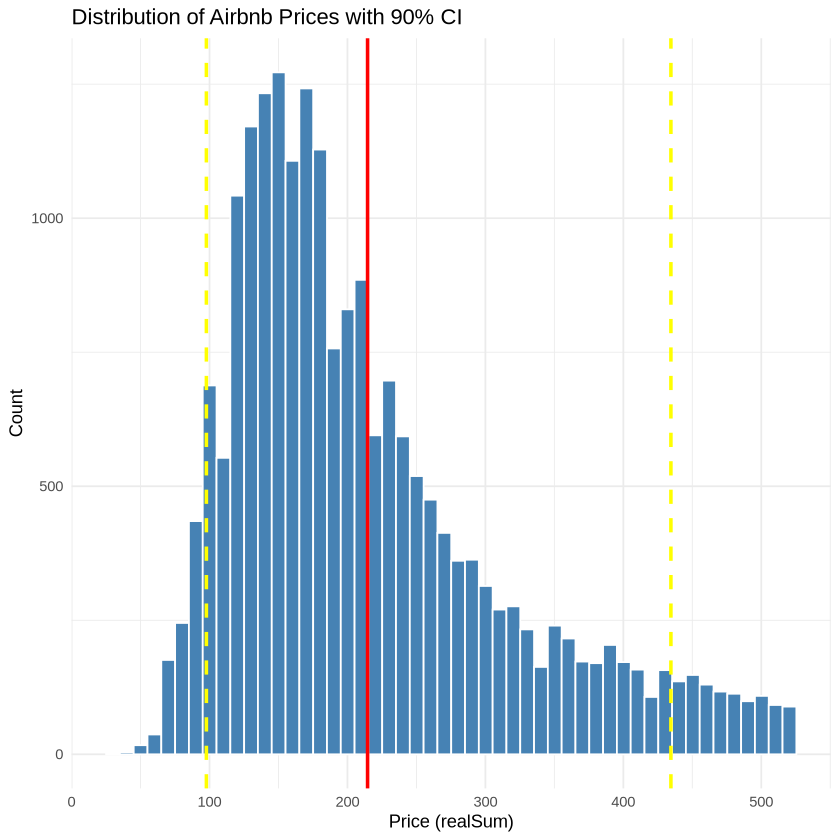

In [26]:
mean_price <- mean(data_clean$realSum, na.rm = TRUE)
p_lower <- quantile(data_clean$realSum, 0.05, na.rm = TRUE)
p_upper <- quantile(data_clean$realSum, 0.95, na.rm = TRUE)

ggplot(data_clean, aes(x = realSum)) +
  geom_histogram(bins = 50, fill = "steelblue", color = "white") +
  geom_vline(xintercept = mean_price, color = "red", linetype = "solid", size = 1) +
  geom_vline(xintercept = p_lower, color = "yellow", linetype = "dashed", size = 1) +
geom_vline(xintercept = p_upper, color = "yellow", linetype = "dashed", size = 1)+
  labs(
    title = "Distribution of Airbnb Prices with 90% CI",
    x = "Price (realSum)",
    y = "Count"
  ) +
  theme_minimal()

<b>This histogram shows the distribution of Airbnb prices (realSum) along with a 90% confidence interval (CI) and the mean price</b>
<li>The plot shows a right-skewed distribution: most listings are priced under $250, but there are a few high-priced listings pulling the tail.</li>
<li>The mean price (red line) lies near the upper end of the main cluster — a result of skewness.</li>
<li>The 90% CI (yellow lines) helps visualize the plausible range in which the true average price likely falls, excluding extreme cases.</li>
<br>

<i>We need to normalize or stratify price when evaluating our model</i>



`geom_smooth()` using formula = 'y ~ x'


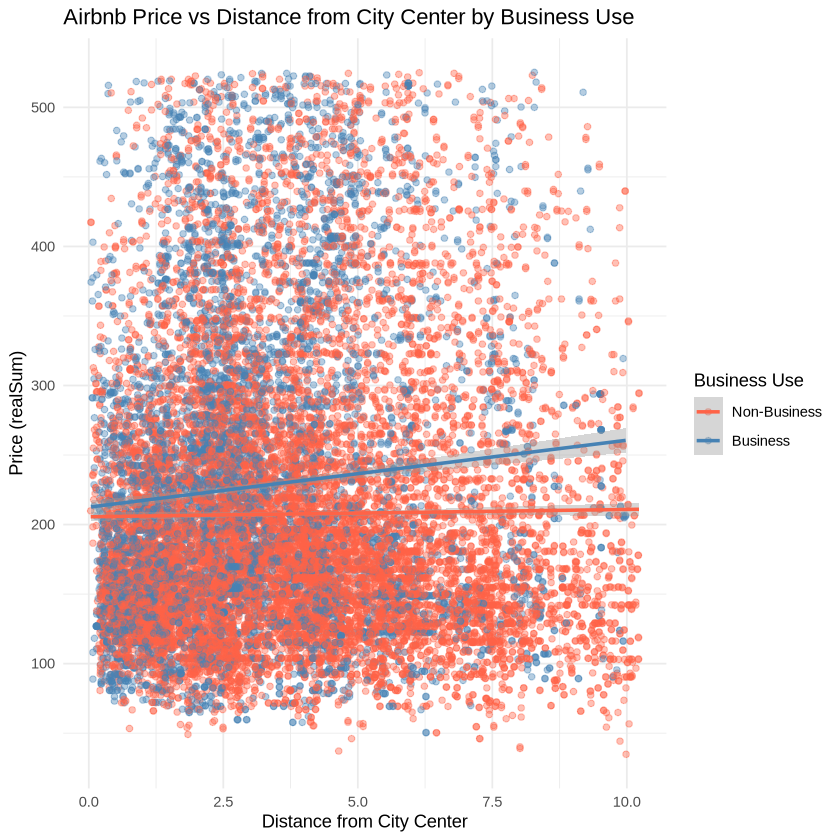

In [23]:
ggplot(data_clean, aes(x = dist, y = realSum, color = factor(biz))) +
  geom_point(alpha = 0.4) +
  scale_color_manual(values = c("tomato", "steelblue"), labels = c("Non-Business", "Business")) +
geom_smooth(method = "lm", size = 1) +
  labs(
    title = "Airbnb Price vs Distance from City Center by Business Use",
    x = "Distance from City Center",
    y = "Price (realSum)",
    color = "Business Use"
  ) +
  theme_minimal()

<b>This scatterplot with regression lines explores the relationship between Airbnb price (realSum), distance from the city center (dist), and whether a listing is used for business or non-business purposes.</b>

Business Listings (Blue):
Price increases with distance slightly.

Non-Business Listings (Red):
Price decreases slightly with distance.

<i>This suggests that the effect of distance on price depends on business use, which is why we should use an interactional model</i>

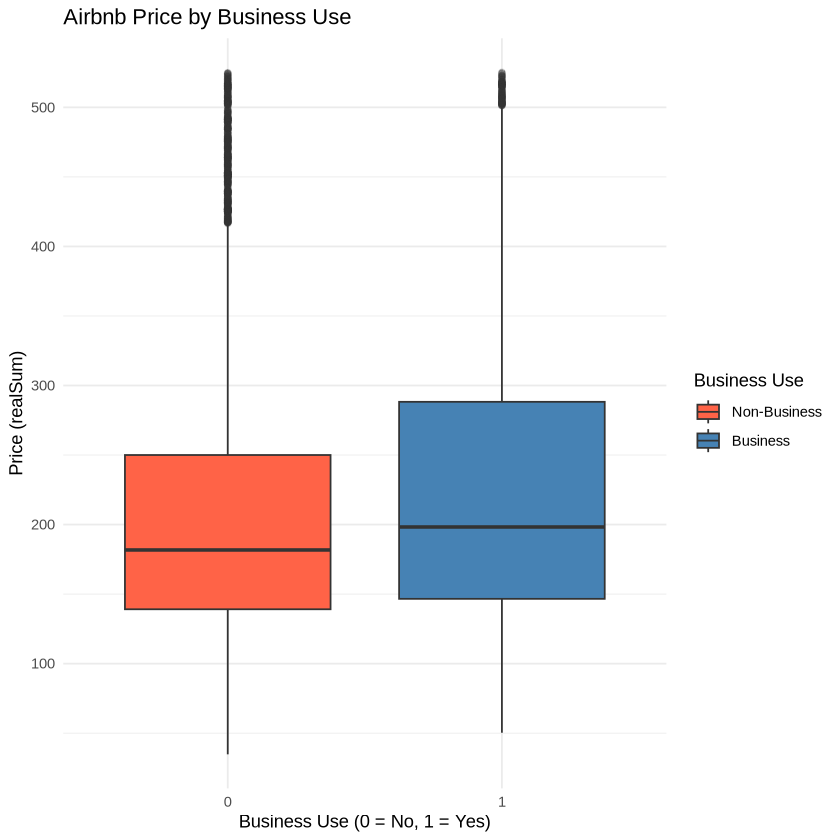

In [25]:
ggplot(data_clean, aes(x = factor(biz), y = realSum, fill = factor(biz))) +
  geom_boxplot(outlier.alpha = 0.2) +
  scale_fill_manual(values = c("tomato", "steelblue"), labels = c("Non-Business", "Business")) +
  labs(
    title = "Airbnb Price by Business Use",
    x = "Business Use (0 = No, 1 = Yes)",
    y = "Price (realSum)",
    fill = "Business Use"
  ) +
  theme_minimal()

<b>This boxplot illustrates the relationship between Airbnb price (realSum) and whether the listing is used for business purposes (biz)</b>
<li>Higher Prices for Business Listings:
The median and upper quartile for business listings are visibly higher than for non-business ones.</li>

<li>Greater Variability for Business Use:
The price distribution is more spread out for business listings, indicating a broader range of listing types or luxury offerings.</li>

<h3><b>4.Methods and Plan <b></h3>

<p>
    To address the question of how <strong>Airbnb price (<code>realSum</code>)</strong> is associated with 
    <strong>distance from the city center (<code>dist</code>)</strong> and 
    <strong>business use (<code>biz</code>)</strong>, 
    I propose using a <strong>multiple linear regression model with an interaction term</strong>:
  </p>




<blockquote><code>realSum ~ biz * dist</code></blockquote>

<p>
    This model includes both the main effects and their interaction, enabling us to determine whether 
    the relationship between price and distance varies by business use status.
  </p>


<h3>Why is this method appropriate?</h3>
  <ul>
    <li>Multiple linear regression models are suitable for analyzing the effect of several predictors on a continuous outcome.</li>
    <li>There is an interaction between  <b>biz</b> and <b>dist</b> as shown by the scatterplot above </li>
    <li>The method is interpretable and statistically efficient when assumptions are met.</li>
  </ul>

<h3>Assumptions of the Method</h3>
  <ul>
    <li><strong>Linearity:</strong> A linear relationship exists between predictors and the outcome.</li>
    <li><strong>Independence:</strong> Observations are independent.</li>
    <li><strong>Homoscedasticity:</strong> Constant variance of residuals across predictor values.</li>
    <li><strong>Normality of residuals:</strong> Residuals should follow a normal distribution.</li>
    <li><strong>No multicollinearity:</strong> Predictors should not be highly correlated.</li>
  </ul>


 <h3>Potential Limitations or Weaknesses</h3>
  <ul>
    <li>Price data may be skewed or contain outliers that violate regression assumptions.</li>
    <li>The relationship may not be strictly linear, limiting model fit.</li>
    <li>Interpreting interaction terms can be complex.</li>
    <li>Unmeasured variables (e.g., amenities, neighborhood) might bias results.</li>
  </ul>